# Coded By: Ashish Jha
AI22MTECH13002

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')
%cd /content/drive/MyDrive/DnCNN-PyTorch

Mounted at /content/drive/
/content/drive/MyDrive/DnCNN-PyTorch


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import os
import argparse
import numpy as np

import torch.optim as optim
import torchvision.utils as utils

from torch.utils.data import DataLoader

from torch.utils.tensorboard import SummaryWriter
from dataset import prepare_data, Dataset
from utils import *
import matplotlib.pyplot as plt

### Defining Model

In [ ]:
##---------- Self Attention Module Created for addition in DnCNN --------#
class SelfAttention(nn.Module):
    def __init__(self, in_channels, k=8):
        super(SelfAttention, self).__init__()

        # Initializing Query 
        self.query_conv = nn.Conv2d(in_channels, in_channels//k, kernel_size=1)
        
        # Initializing Key and Values
        self.key_conv = nn.Conv2d(in_channels, in_channels//k, kernel_size=1)
        self.value_conv = nn.Conv2d(in_channels, in_channels, kernel_size=1)
        
    def forward(self, x):
        # Get the batch size
        N, C, H, W = x.size()

        # Compute Query values
        query = self.query_conv(x).view(N, -1, H*W).permute(0, 2, 1)
        key = self.key_conv(x).view(N, -1, H*W)
        
        # computing Energy = Q @ K.transpose() through batch Matrix multiplication
        energy = torch.bmm(query, key)

        # Getting attention scores through softmax
        attention = F.softmax(energy, dim=2)
        value = self.value_conv(x).view(N, -1, H*W)
        out = torch.bmm(value, attention.permute(0, 2, 1))

        # Converting back to the original batch size
        out = out.view(N, C, H, W)
        return out

In [ ]:
#---- Amended for self attention from original paper ------ #
class DnCNN(nn.Module):
    def __init__(self, channels, num_of_layers=17):
        super(DnCNN, self).__init__()
        kernel_size = 3
        padding = 1
        features = 64
        layers = []
        layers.append(nn.Conv2d(in_channels=channels, out_channels=features, kernel_size=kernel_size, padding=padding, bias=False))
        layers.append(nn.ReLU(inplace=True))
        for i in range(num_of_layers-2):
            layers.append(nn.Conv2d(in_channels=features, out_channels=features, kernel_size=kernel_size, padding=padding, bias=False))
            layers.append(nn.BatchNorm2d(features))
            layers.append(nn.ReLU(inplace=True))

            # if i==6:
            #     layers.append(SelfAttention(features))

        # Appending self attention layer before out layer    
        layers.append(SelfAttention(features))

        layers.append(nn.Conv2d(in_channels=features, out_channels=channels, kernel_size=kernel_size, padding=padding, bias=False))
        self.dncnn = nn.Sequential(*layers)

    def forward(self, x):
        # forwards through DnCnn with Self attention
        out = self.dncnn[0](x)
        for layer in self.dncnn[1:]:
            out = layer(out)
        return out

### Preprocess

In [ ]:
# Using same preprocessing (and code) as in the implementation of original paper
# Files (dataset.py and utils.py) are implemented--> at https://github.com/cszn/DnCNN

### Setting Parameters

In [ ]:
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [ ]:
preprocess = False
batchSize = 128
num_of_layers = 17
epochs = 10
lr = 1e-3
milestone = 30 # decay learning rate after 30 epochs
outf = "logs"
mode = "S" #with known noise level (S) or blind training (B)
noiseL = 25 # noise level; ignored when mode=B
val_noiseL = 25 #noise level used on validation set'



### Training

In [ ]:
##------- Train function modified from DnCNN Train module ---------##
psnr_list = []
def train(preprocess, batchSize, num_of_layers, epochs,lr = 1e-3,mode = "S",noiseL = 25, val_noiseL = 25):
    
    # Load dataset
    print('Loading dataset ...\n')
    dataset_train = Dataset(train=True)
    dataset_val = Dataset(train=False)
    loader_train = DataLoader(dataset=dataset_train, num_workers=4, batch_size = batchSize, shuffle=True)
    print("# of training samples: %d\n" % int(len(dataset_train)))
    
    # Build model
    net = DnCNN(channels=1, num_of_layers= num_of_layers)
    net.apply(weights_init_kaiming)
    
    criterion = nn.MSELoss(reduction= 'sum')
    
    # Move to GPU
    device_ids = [0]
    model = nn.DataParallel(net, device_ids=device_ids).cuda()
    criterion.cuda()
    
    # Optimizer
    optimizer = optim.Adam(model.parameters(), lr= lr)
    
    # training
    writer = SummaryWriter(outf)
    step = 0
    noiseL_B=[0,55] # ingnored when mode=='S'
    
    for epoch in range(epochs):
        running_psnr = 0

        if epoch < milestone:
            current_lr = lr
        else:
            current_lr = lr / 10.
        
        # set learning rate
        for param_group in optimizer.param_groups:
            param_group["lr"] = current_lr
        print('learning rate %f' % current_lr)
        
        # train
        for i, data in enumerate(loader_train, 0):
            # training step
            model.train()
            model.zero_grad()
            optimizer.zero_grad()
            img_train = data
            if mode == 'S':
                noise = torch.FloatTensor(img_train.size()).normal_(mean=0, std= noiseL/255.)
            
            if mode == 'B':
                noise = torch.zeros(img_train.size())
                stdN = np.random.uniform(noiseL_B[0], noiseL_B[1], size=noise.size()[0])
                for n in range(noise.size()[0]):
                    sizeN = noise[0,:,:,:].size()
                    noise[n,:,:,:] = torch.FloatTensor(sizeN).normal_(mean=0, std=stdN[n]/255.)
            
            imgn_train = img_train + noise
            
            img_train, imgn_train = img_train.cuda(), imgn_train.cuda()

            noise = noise.cuda()
            
            out_train = model(imgn_train)
            loss = criterion(out_train, noise) / (imgn_train.size()[0]*2)
            loss.backward()
            optimizer.step()
            
            # results
            model.eval()
            out_train = torch.clamp(imgn_train-model(imgn_train), 0., 1.)
            psnr_train = batch_PSNR(out_train, img_train, 1.)

            running_psnr += psnr_train
            if (i+1) %50 == 0:
                print("[epoch %d][%d/%d] loss: %.4f PSNR_train: %.4f" %
                    (epoch+1, i+1, len(loader_train), loss.item(), psnr_train))
                psnr_list.append(running_psnr / 50)
                running_psnr = 0

            if step % 10 == 0:
                # Log the scalar values
                writer.add_scalar('loss', loss.item(), step)
                writer.add_scalar('PSNR on training data', psnr_train, step)
            step += 1
        
        # ---> Error: Eval not feasible due to Memory constraint on Google Colab
        # Evaluating on validation set
        model.eval()

        # validate
        psnr_val = 0
        with torch.no_grad():
            for k in range(len(dataset_val)):

                #--- Adjusting validation image size, for handling by Colab memory
                img_val = torch.unsqueeze(dataset_val[k][0][40:80,40:80].reshape(1,40,40), 0)
                
                noise = torch.FloatTensor(img_val.size()).normal_(mean=0, std=val_noiseL/255.)
                
                imgn_val = img_val + noise
                
                img_val, imgn_val = img_val.cuda(), imgn_val.cuda()
                
                out_val = torch.clamp(imgn_val-model(imgn_val), 0., 1.)
                psnr_val += batch_PSNR(out_val, img_val, 1.)
                
        psnr_val /= len(dataset_val)


        print("\n[epoch %d] PSNR_val: %.4f" % (epoch+1, psnr_val))
        writer.add_scalar('PSNR on validation data', psnr_val, epoch)
        
        # save model
        if mode == 'B':
            torch.save(model.state_dict(), os.path.join(outf, 'net_attention_blind.pth'))
        else:
            torch.save(model.state_dict(), os.path.join(outf, 'net_attention_singlevar.pth'))
        plt.plot(psnr_list)
    return model



In [ ]:
if preprocess:
    if mode == 'S':
        prepare_data(data_path='data', patch_size=40, stride=10, aug_times=1)
    if mode == 'B':
        prepare_data(data_path='data', patch_size=50, stride=10, aug_times=2)


Loading dataset ...



/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


# of training samples: 238400



/content/drive/MyDrive/DnCNN-PyTorch/utils.py:11: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  nn.init.kaiming_normal(m.weight.data, a=0, mode='fan_in')
/content/drive/MyDrive/DnCNN-PyTorch/utils.py:17: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  nn.init.constant(m.bias.data, 0.0)


learning rate 0.001000
[epoch 1][50/1863] loss: 11.6772 PSNR_train: 22.1980
[epoch 1][100/1863] loss: 12.8179 PSNR_train: 21.8532
[epoch 1][150/1863] loss: 13.5415 PSNR_train: 21.8818
[epoch 1][200/1863] loss: 13.2896 PSNR_train: 21.9302
[epoch 1][250/1863] loss: 12.4916 PSNR_train: 22.0298
[epoch 1][300/1863] loss: 12.3191 PSNR_train: 22.5398
[epoch 1][350/1863] loss: 10.8309 PSNR_train: 21.3697
[epoch 1][400/1863] loss: 2.4245 PSNR_train: 25.9081
[epoch 1][450/1863] loss: 2.4453 PSNR_train: 26.9901
[epoch 1][500/1863] loss: 1.7701 PSNR_train: 26.7386
[epoch 1][550/1863] loss: 2.1703 PSNR_train: 27.5402
[epoch 1][600/1863] loss: 1.6492 PSNR_train: 28.7667
[epoch 1][650/1863] loss: 2.0071 PSNR_train: 27.8639
[epoch 1][700/1863] loss: 2.0338 PSNR_train: 28.0849
[epoch 1][750/1863] loss: 1.6709 PSNR_train: 29.2675
[epoch 1][800/1863] loss: 1.5285 PSNR_train: 29.2890
[epoch 1][850/1863] loss: 1.7349 PSNR_train: 29.0542
[epoch 1][900/1863] loss: 1.8063 PSNR_train: 26.5932
[epoch 1][950/186

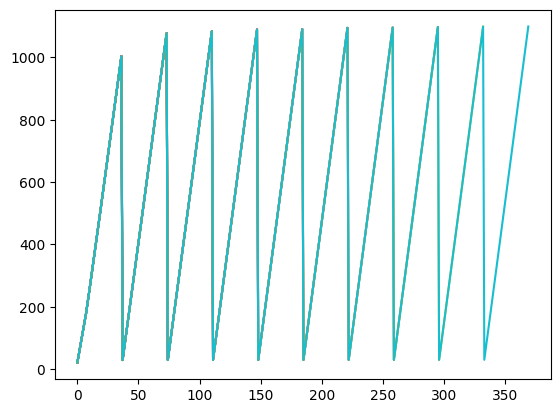

In [ ]:
preprocess = True
model_b = train(preprocess, batchSize, num_of_layers, epochs, lr , mode = "B", noiseL = 25, val_noiseL = 25)

In [ ]:
# model2 = DnCNN(channels=1, num_of_layers= num_of_layers)
# model2.load_state_dict(torch.load('net.pth'))
# model2.state_dict()
# "/content/gdrive/My Drive/{model_save_name}
# torch.save(model.state_dict(), os.path.join(outf, '/content/gdrive/My Drive/net_attention_singlevar.pth'))

In [ ]:
dataset_val = Dataset(train=False)
dataset_val[9].shape

torch.Size([1, 256, 256])

Loading dataset ...



/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/content/drive/MyDrive/DnCNN-PyTorch/utils.py:11: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  nn.init.kaiming_normal(m.weight.data, a=0, mode='fan_in')
/content/drive/MyDrive/DnCNN-PyTorch/utils.py:17: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  nn.init.constant(m.bias.data, 0.0)


# of training samples: 238400

learning rate 0.001000
[epoch 1][50/1863] loss: 7.7120 PSNR_train: 20.3855
[epoch 1][100/1863] loss: 7.6978 PSNR_train: 20.4301
[epoch 1][150/1863] loss: 7.6977 PSNR_train: 20.4183
[epoch 1][200/1863] loss: 7.6671 PSNR_train: 20.4246
[epoch 1][250/1863] loss: 7.6680 PSNR_train: 20.3897
[epoch 1][300/1863] loss: 7.6779 PSNR_train: 20.4174
[epoch 1][350/1863] loss: 6.1184 PSNR_train: 20.8040
[epoch 1][400/1863] loss: 2.0914 PSNR_train: 25.9505
[epoch 1][450/1863] loss: 1.5652 PSNR_train: 25.5190
[epoch 1][500/1863] loss: 1.6056 PSNR_train: 27.0976
[epoch 1][550/1863] loss: 1.4589 PSNR_train: 27.8767
[epoch 1][600/1863] loss: 1.6209 PSNR_train: 27.4690
[epoch 1][650/1863] loss: 1.5044 PSNR_train: 27.9332
[epoch 1][700/1863] loss: 1.5266 PSNR_train: 27.9943
[epoch 1][750/1863] loss: 1.5163 PSNR_train: 28.0663
[epoch 1][800/1863] loss: 1.4565 PSNR_train: 28.2192
[epoch 1][850/1863] loss: 1.5025 PSNR_train: 28.1695
[epoch 1][900/1863] loss: 1.4847 PSNR_train: 2

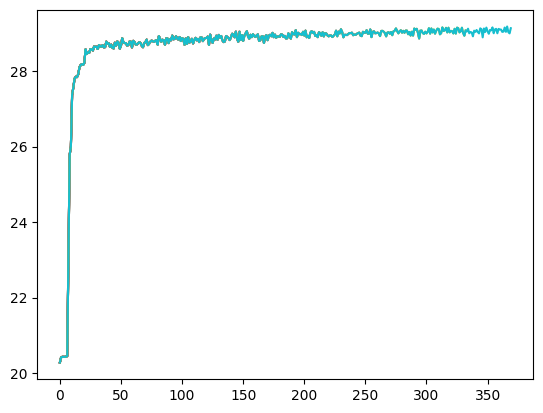

In [ ]:
preprocess = True
epochs = 10
model_S25 = train(preprocess, batchSize, num_of_layers, epochs, lr , mode = "S", noiseL = 25, val_noiseL = 25)

In [ ]:
torch.save(model_S25.state_dict(), os.path.join(outf, '/content/gdrive/My Drive/net_attention_singlevar.pth'))

In [ ]:
##==== --------Making Predictions--------
dataset_train = Dataset(train=True)
#-- Get an image
img_val = torch.unsqueeze(dataset_val[10][0][40:80,40:80].reshape(1,40,40), 0)
# img_val = torch.unsqueeze(dataset_train[10][0][:40,:40].reshape(1,40,40), 0)
#-- Add noise
noise = torch.FloatTensor(img_val.size()).normal_(mean=0, std=val_noiseL/255.)
imgn_val = img_val + noise

#-- Move to GPU
img_val, imgn_val = img_val.cuda(), imgn_val.cuda()


out_val = torch.clamp(imgn_val-model_S25(imgn_val), 0., 1.)
psnr_val = batch_PSNR(out_val, img_val, 1.)

In [ ]:
print(psnr_val)
out_val.shape

35.56569034564513


torch.Size([1, 1, 40, 40])

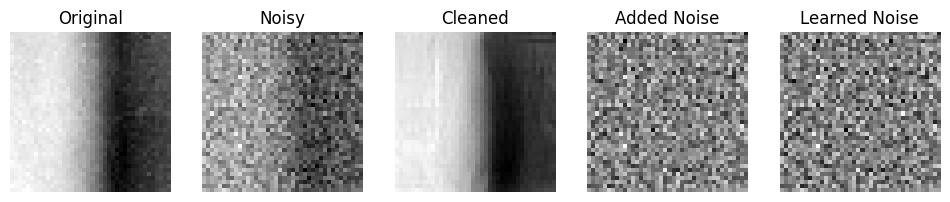

In [ ]:
plt.figure(figsize=(12, 6))
plt.subplot(151)
plt.title("Original")
plt.imshow(img_val[0][0].cpu().detach().numpy(), 'gray')
plt.axis('off')

plt.subplot(153)
plt.title("Cleaned")
plt.imshow(out_val[0][0].cpu().detach().numpy(), 'gray')
plt.axis('off')

plt.subplot(152)
plt.title("Noisy")
plt.imshow(imgn_val[0][0].cpu().detach().numpy(), 'gray')
plt.axis('off')

plt.subplot(154)
plt.title("Added Noise")
plt.imshow(noise[0][0].cpu().detach().numpy(), 'gray')
plt.axis('off')

plt.subplot(155)
plt.title("Learned Noise")
plt.imshow(model_S25(imgn_val)[0][0].cpu().detach().numpy(), 'gray')
plt.axis('off')
plt.show()

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/DnCNN-PyTorch

<IPython.core.display.Javascript object>